# Segmentation

The goal is group similar areas together from the lined image  and fill it with the correct color based on the colorization made earlier

### Setup

In [1]:
%matplotlib inline


###WARNING!!!! REMOVE THIS IF YOUR COMPUTER IS CHEAP!!!###
# INCREASES THE RECURSION LIMIT
import resource, sys
resource.setrlimit(resource.RLIMIT_STACK, (2**29,-1))
sys.setrecursionlimit(10**6)

##########################################################

### Import modules

In [2]:
import scipy as sp
import numpy as np
import cv2
from matplotlib import pyplot as plt
from scipy import signal as ssignal
from numpy import matrix
from numpy import amax

### Union Find Algorithm for 2D Matrices (1-Layer Images)
-A graph algorithm that can group nodes of together. 

We will use this to segement areas from a lineart image

In [3]:
def find(leader,n):
    x,y = n
    if (x,y) != leader[x][y]:
        leader[x][y] = find(leader, leader[x][y])
    return leader[x][y]

def connect(leader,size, a, b):
    la, lb = find(leader, a), find(leader, b)
    if la == lb:
        return
    if la < lb:
        la, lb = lb, la
    (xb,yb) = lb
    (xa,ya) = la
    leader[xb][yb] = la
    size[xa][ya] += size[xb][yb] 

def query(leader, a, b):
    return find(leader, a) == find(leader, b)

### Inputs
- There are two inputs, the line/edge and the colorized output

Text(0.5, 1.0, 'Colorized')

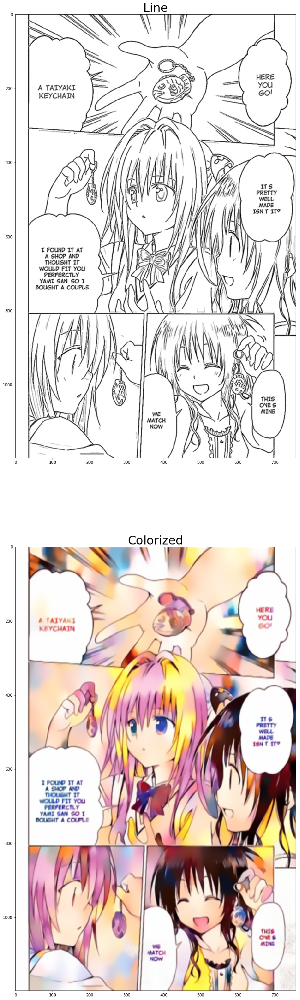

In [167]:
img = "../data/val_line_set2/lineframe042.jpg"
img0 = cv2.imread(img,)

img = "../data/data_out_test5-line2color/49.jpg"
img1 = cv2.imread(img,)
color = np.uint8(img1)
cv2.fastNlMeansDenoising(color,color,10)
color = cv2.resize(color,(1170,1170*img0.shape[0]//img0.shape[1])) #Magic happens here for some odd reason :)            
color = cv2.resize(color,(img0.shape[1],img0.shape[0]))
color = cv2.GaussianBlur(color,(3,3),0)
cv2.fastNlMeansDenoising(color,color,20)
color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)


line = cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY) * 1.0
plt.figure(figsize=(60,60*img0.shape[0]/img0.shape[1]))
plt.subplot(411),plt.imshow(line,cmap = 'gray')
plt.title('Line',fontsize=30)
plt.subplot(412),plt.imshow(color)
plt.title('Colorized',fontsize=30)

### Segmentation
#### Use Union Find to segment common areas together

In [200]:
leader = [[(i,j) for j in range(line.shape[1])] for i in range(line.shape[0])]
size = [[1 for j in range(line.shape[1])] for i in range(line.shape[0])]


for i in range(line.shape[0]-1):
    for j in range(line.shape[1]-1):
        if line[i][j] >= 200  and i != 0 and line[i-1][j] >= 200 and j != 0 and line[i][j-1] >= 200:
            connect(leader,size,leader[i][j],leader[i-1][j])
            connect(leader,size,leader[i][j],leader[i][j-1]) 

#### Get the average color per segment

In [206]:
c = [[[0 for j in range(3)] for i in range(line.shape[1])] for k in range(line.shape[0])]
color2 = np.copy(color)


for i in range(line.shape[0]-1):
    for j in range(line.shape[1]-1):
        x,y = find(leader,(i,j))
        for k in range(3):
            c[x][y][k] += color[i][j][k]

for i in range(line.shape[0]-1):
    for j in range(line.shape[1]-1):
        x,y = find(leader,(i,j))
        if i == x and j == y:
            for k in range(3):
                color2[x][y][k] = c[x][y][k]/size[x][y]           

#### Fill the segments with the same Hue and balance the saturation and luminance

In [213]:
color3 = cv2.cvtColor(color2, cv2.COLOR_RGB2HSV)
line3 = np.copy(color3)

for i in range(line3.shape[0]-1):
    for j in range(line3.shape[1]-1):
        x,y = find(leader,(i,j))
        line3[i][j][0] = color3[x][y][0]
        line3[i][j][1] = max(min(color3[x][y][1]+20,color3[i][j][1]),color3[x][y][1]-20)
        line3[i][j][2] = min(line[i][j],max(min(color3[x][y][2]+20,color3[i][j][2]),color3[x][y][2]-20))

### Output

Text(0.5, 1.0, 'Segmented')

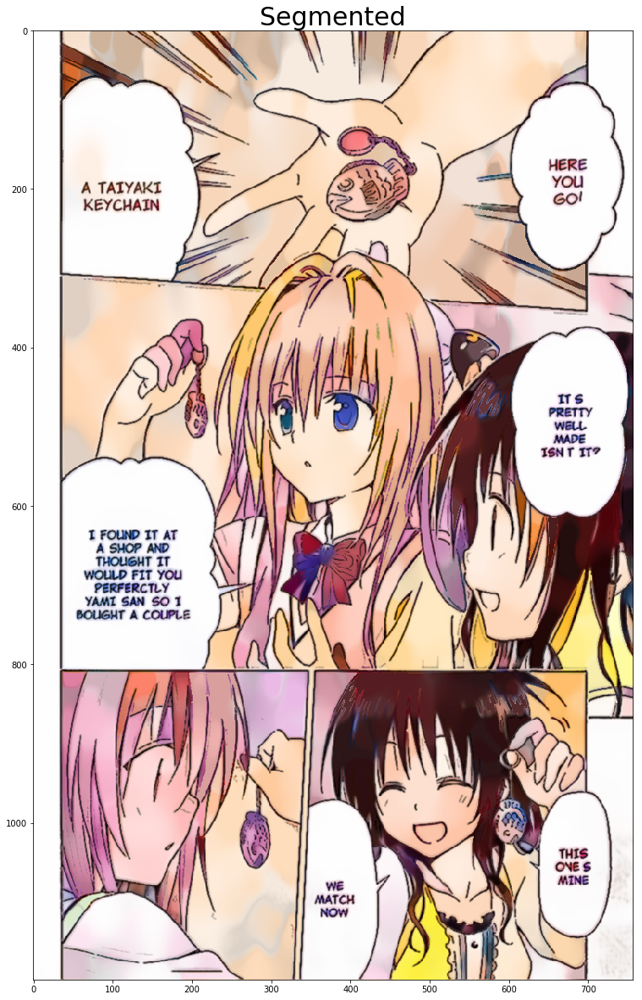

In [215]:
line4 = cv2.cvtColor(line3, cv2.COLOR_HSV2RGB)
color4 = cv2.cvtColor(color3, cv2.COLOR_HSV2RGB)
plt.figure(figsize=(60,60*img0.shape[0]/img0.shape[1]))
plt.subplot(411),plt.imshow(line4)
plt.title('Segmented',fontsize=30)

### Segmentation Function

In [219]:
def Segmentation(img,img_1):
    img0 = cv2.imread(img,)
    img1 = cv2.imread(img_1,)
    color = np.uint8(img1)
    cv2.fastNlMeansDenoising(color,color,10)
    color = cv2.resize(color,(1170,1170*img0.shape[0]//img0.shape[1])) #Magic happens here for some odd reason :)            
    color = cv2.resize(color,(img0.shape[1],img0.shape[0]))
    color = cv2.GaussianBlur(color,(3,3),0)
    cv2.fastNlMeansDenoising(color,color,20)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    line = cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY) * 1.0
    
    leader = [[(i,j) for j in range(line.shape[1])] for i in range(line.shape[0])]
    size = [[1 for j in range(line.shape[1])] for i in range(line.shape[0])]


    for i in range(line.shape[0]-1):
        for j in range(line.shape[1]-1):
            if line[i][j] >= 200  and i != 0 and line[i-1][j] >= 200 and j != 0 and line[i][j-1] >= 200:
                connect(leader,size,leader[i][j],leader[i-1][j])
                connect(leader,size,leader[i][j],leader[i][j-1]) 
    c = [[[0 for j in range(3)] for i in range(line.shape[1])] for k in range(line.shape[0])]
    color2 = np.copy(color)


    for i in range(line.shape[0]-1):
        for j in range(line.shape[1]-1):
            x,y = find(leader,(i,j))
            for k in range(3):
                c[x][y][k] += color[i][j][k]

    for i in range(line.shape[0]-1):
        for j in range(line.shape[1]-1):
            x,y = find(leader,(i,j))
            if i == x and j == y:
                for k in range(3):
                    color2[x][y][k] = c[x][y][k]/size[x][y]    
    color3 = cv2.cvtColor(color2, cv2.COLOR_RGB2HSV)
    line3 = np.copy(color3)

    for i in range(line3.shape[0]-1):
        for j in range(line3.shape[1]-1):
            x,y = find(leader,(i,j))
            line3[i][j][0] = color3[x][y][0]
            line3[i][j][1] = max(min(color3[x][y][1]+20,color3[i][j][1]),color3[x][y][1]-20)
            line3[i][j][2] = min(line[i][j],max(min(color3[x][y][2]+20,color3[i][j][2]),color3[x][y][2]-20))
    line4 = cv2.cvtColor(line3, cv2.COLOR_HSV2RGB)
    color4 = cv2.cvtColor(color3, cv2.COLOR_HSV2RGB)
    
    plt.figure(figsize=(60,60*img0.shape[0]/img0.shape[1]))
    plt.subplot(411),plt.imshow(line,cmap = 'gray')
    plt.title('Line',fontsize=30)
    plt.subplot(412),plt.imshow(color)
    plt.title('Colorized',fontsize=30)
    plt.figure(figsize=(60,60*img0.shape[0]/img0.shape[1]))
    plt.subplot(413),plt.imshow(line4)
    plt.title('Segmented',fontsize=30)

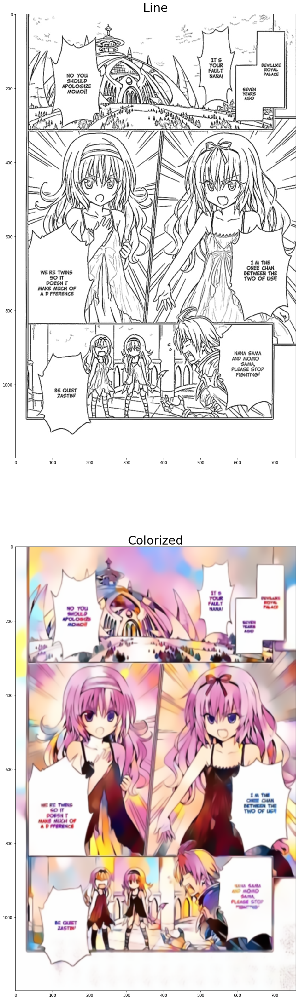

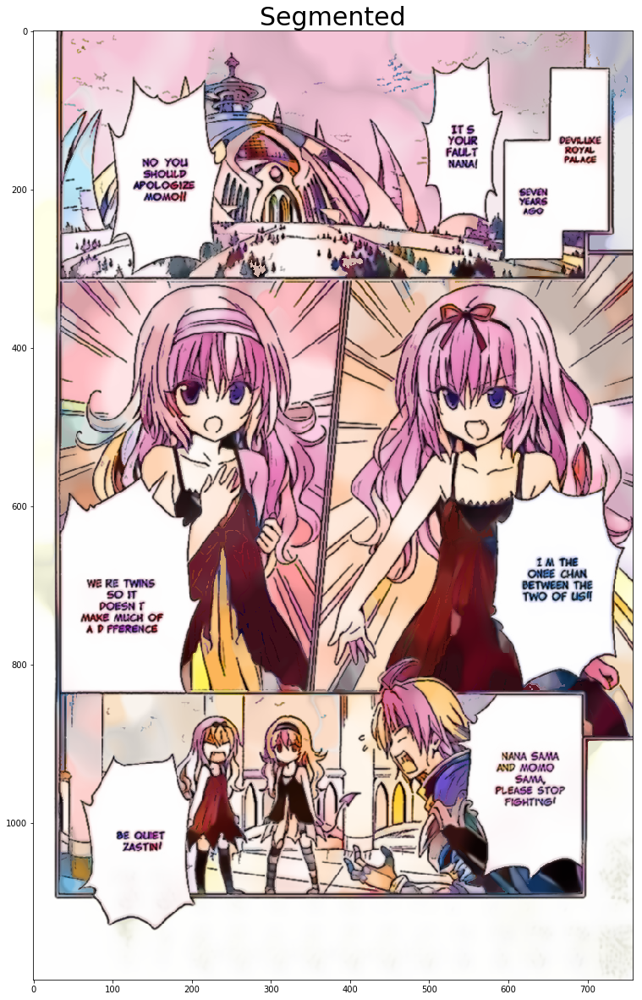

In [220]:
Segmentation("../data/val_line_set2/lineframe072.jpg","../data/data_out_test5-line2color/32.jpg")

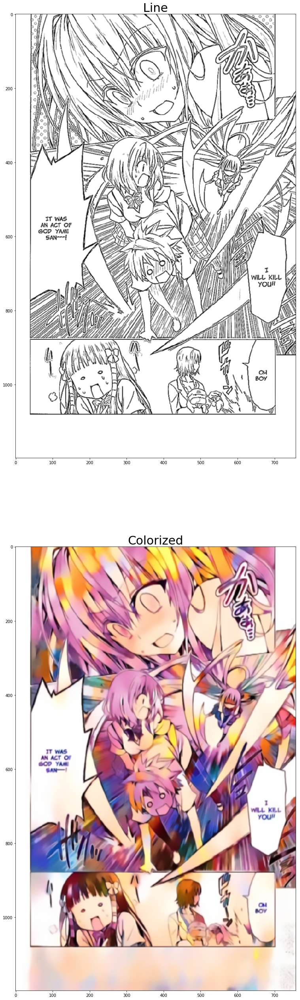

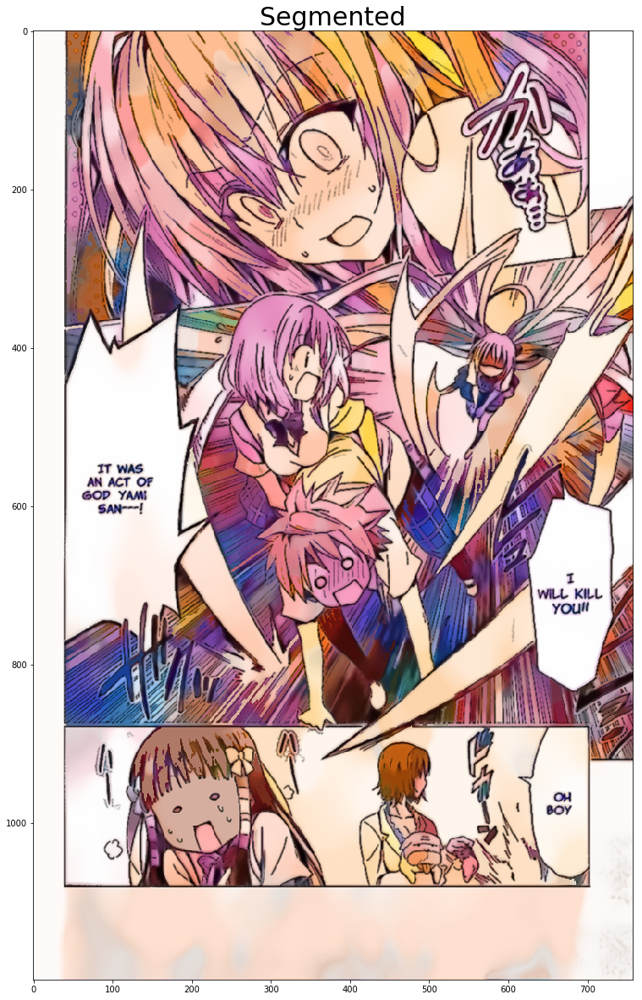

In [221]:
Segmentation("../data/val_line_set2/lineframe124.jpg","../data/data_out_test5-line2color/3.jpg")